In [1]:
import h5py
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import sys
import os
import random
sys.path.append(os.path.abspath("../"))

# KMP_DUPLICATE_LIB_OK=TRUE
os.environ["KMP_DUPLICATE_LIB_OK"] = "TRUE"

In [2]:
from omegaconf import OmegaConf
from hydra import initialize, compose
from src.data_loading_well import load_data_by_well

# Path to your Hydra config directory
config_path = "../configs"       # Adjust as needed
config_name = "config"        # Name of your YAML file without .yaml

# Load the config
with initialize(version_base=None, config_path=config_path):
    cfg = compose(config_name=config_name)
print(OmegaConf.to_yaml(cfg))

project:
  name: VAE_BBBC021
model:
  name: VAEMedium
  input_channels: 3
  latent_dim: 256
data:
  train_path: data/raw/BBBC021_dataset_cleaned_maxnorm_68.h5
  metadata_path: data/raw/metadata_dataset.h5
  crop_pixels: 0
  train_ratio: 0.8
  val_ratio: 0.1
  test_ratio: 0.1
train:
  batch_size: 256
  epochs: 30
  learning_rate: 0.001
  discriminator_lr: 0.01



In [3]:
# Path to the cleaned + preprocessed dataset
h5_path = '../data/raw/BBBC021_dataset.h5'

with h5py.File(h5_path, 'r') as h5f:
    images = h5f['images']
    names = h5f['image_names']

    num_images = images.shape[0]
    img_shape = images.shape[1:]
    dtype = images.dtype

    print(f"Dataset loaded from: {h5_path}")
    print(f"Number of images: {num_images}")
    print(f"Image shape: {img_shape}")
    print(f"Data type: {dtype}")
    print(f"Sample names: {[names[i].decode('utf-8') for i in range(min(5, num_images))]}")

Dataset loaded from: ../data/raw/BBBC021_dataset.h5
Number of images: 488396
Image shape: (68, 68, 3)
Data type: uint16
Sample names: ['B02_s1_w16F89C55C-7808-4136-82E4-E066F8E3CB10_0.npy', 'B02_s1_w16F89C55C-7808-4136-82E4-E066F8E3CB10_1.npy', 'B02_s1_w16F89C55C-7808-4136-82E4-E066F8E3CB10_10.npy', 'B02_s1_w16F89C55C-7808-4136-82E4-E066F8E3CB10_100.npy', 'B02_s1_w16F89C55C-7808-4136-82E4-E066F8E3CB10_101.npy']


In [4]:
def get_random_image(num_samples=10000, seed=0):
    h5_path = '../data/raw/BBBC021_dataset.h5'
    with h5py.File(h5_path, 'r') as h5f:
        images = h5f['images']
        random.seed(seed)
        num_samples = num_samples
        indices = random.sample(range(images.shape[0]), num_samples)
        sorted_indices = sorted(indices)
        sampled_images = images[sorted_indices]
    return sampled_images

In [5]:
import numpy as np
import random
from matplotlib.ticker import ScalarFormatter

# take max norm of all images
def max_normalize_image(image: np.ndarray) -> np.ndarray:
    image = image.astype(np.float32)
    max_vals = image.max(axis=(0, 1), keepdims=True)  # shape (1, 1, C)
    max_vals = np.maximum(max_vals, 1e-5)  # prevent division by 0
    return image / max_vals

def plot_pixel_value_distribution_orig_vs_normalized(images: np.ndarray, num_samples: int = 1000):
    # Set up 2×3 grid
    channel_labels = ['Red', 'Green', 'Blue']
    colors = ['r', 'g', 'b']

    # Biological meaning
    labels = ["DAPI", "F-Actin", r"$\beta$-Tubulin"]  # R, G, B

    normalized_images = np.zeros_like(images, dtype=np.float32)
    for i in range(images.shape[0]):
        normalized_images[i] = max_normalize_image(images[i])

    fig, axs = plt.subplots(2, 3, figsize=(10, 5))
    formatter = ScalarFormatter(useMathText=True)
    formatter.set_powerlimits((0, 0))  # always use scientific notation
    for c in range(3):
        axs[0, c].hist(images[:, :, :, c].ravel(), bins=50, color=colors[c], alpha=0.7, density=True, label=labels[c])
        axs[0, c].set_title(f"{channel_labels[c]}")
        axs[0, 0].set_ylabel("Original - Frequency", fontsize=12)
        axs[0, c].set_xlim(0, 65535)  # 16-bit TIFF images
        axs[0, c].legend()
        axs[0, c].yaxis.set_major_formatter(formatter)

        axs[1, c].hist(normalized_images[:, :, :, c].ravel(), bins=50, color=colors[c], alpha=0.7, density=True, label=labels[c])
        # axs[1, c].set_title(f"Max-Norm - {channel_labels[c]}")
        axs[1, c].set_xlabel("Pixel Intensity", fontsize=12)
        axs[1, 0].set_ylabel("Max-Norm - Frequency", fontsize=12)
        axs[1, c].legend()

    plt.tight_layout()
    plt.suptitle("BBBC021 - Channel Intensity Distributions (sample of 1000 images)", y=1.03, fontsize=16)
    plt.show()

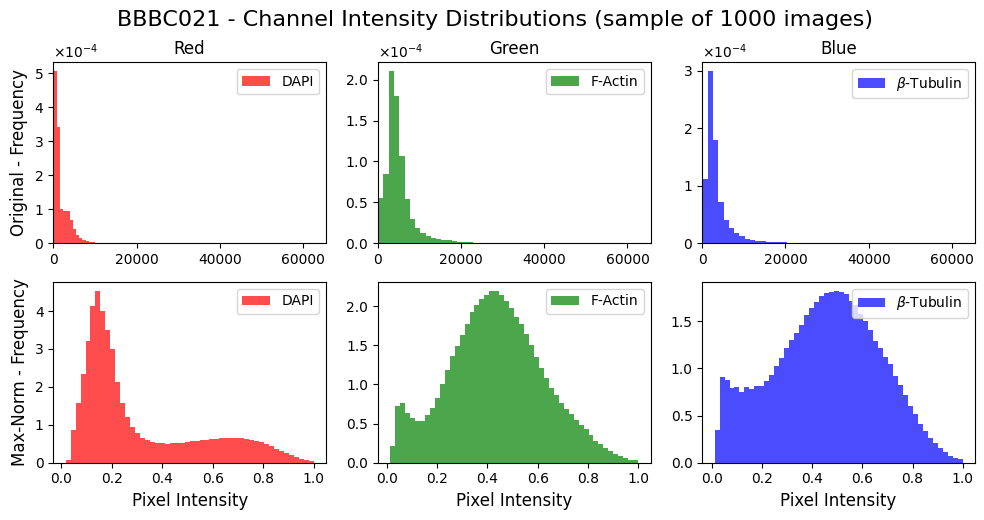

In [6]:
plot_pixel_value_distribution_orig_vs_normalized(get_random_image(1000))

In [7]:
from src.data_loading_well import load_data_by_well, load_metadata

# Load all data and metadata
cfg.data.metadata_path = '../data/raw/metadata_dataset.h5'
cfg.data.train_path = '../data/raw/BBBC021_dataset_cleaned_maxnorm_68.h5'
data_loader = load_data_by_well(cfg, split="all")

# Extract values
num_images = len(data_loader.dataset)
image_shape = next(iter(data_loader))[0][0].shape  # (C, H, W)

In [8]:
train_loader = load_data_by_well(cfg, split="train")
val_loader = load_data_by_well(cfg, split="val")
test_loader = load_data_by_well(cfg, split="test")

Total wells Train: 884, Val: 39, Test: 39
Total images in train: 441588 (91.85% of total)
Total wells Train: 884, Val: 39, Test: 39
Total images in val: 19448 (4.05% of total)
Total wells Train: 884, Val: 39, Test: 39
Total images in test: 19727 (4.10% of total)


In [9]:
cfg.data.metadata_path = "../data/raw/metadata_dataset.h5"
with h5py.File(cfg.data.metadata_path, 'r') as f:
    wells = f["metadata_well"][:].astype(str)
    compounds = f["metadata_compound"][:].astype(str)
    concentrations = f["metadata_concentration"][:].astype(str)
    moas = f["metadata_moa"][:].astype(str)

meta_df = pd.DataFrame({
    "well": wells,
    "compound": compounds,
    "concentration": concentrations,
    "moa": moas
})

In [10]:
summary = {
    "Total images": [num_images],
    "Wells": [len(set(wells))],
    "Compounds": [len(set(compounds))],
    "MoAs": [len(set(moas))],
    "Image size": [f"{image_shape[1]}×{image_shape[2]}×{image_shape[0]}"],
}

summary_df = pd.DataFrame(summary).T
summary_df.columns = ["Value"]
summary_df

,Value
Total images,480763
Wells,962
Compounds,39
MoAs,13
Image size,68×68×3


In [11]:
# Use the subset that we get from the different loaders to index the metadata
meta_df_train = meta_df.iloc[train_loader.dataset.indices]
meta_df_val = meta_df.iloc[val_loader.dataset.indices]
meta_df_test = meta_df.iloc[test_loader.dataset.indices]

In [12]:
# Print Number of unique wells, compounds, concentrations, and MoAs in each split
def print_unique_counts(df, split_name):
    print(f"\n{split_name} Split:")
    print(f"Unique Wells: {df['well'].nunique()}")
    print(f"Unique Compounds: {df['compound'].nunique()}")
    print(f"Unique Concentrations: {df['concentration'].nunique()}")
    print(f"Unique MoAs: {df['moa'].nunique()}")
    
print_unique_counts(meta_df_train, "Train")
print_unique_counts(meta_df_val, "Validation")
print_unique_counts(meta_df_test, "Test")


Train Split:
Unique Wells: 884
Unique Compounds: 38
Unique Concentrations: 19
Unique MoAs: 13

Validation Split:
Unique Wells: 39
Unique Compounds: 39
Unique Concentrations: 15
Unique MoAs: 13

Test Split:
Unique Wells: 39
Unique Compounds: 39
Unique Concentrations: 13
Unique MoAs: 13


In [13]:
def wells_per_moa(meta_df):
    wells_per_moa = meta_df.groupby('moa')['well'].nunique().reset_index()
    wells_per_moa.columns = ['MoA', 'Unique Wells']
    wells_per_moa = wells_per_moa.sort_values(by='Unique Wells', ascending=False)
    return wells_per_moa

wells_per_moa_all = wells_per_moa(meta_df)
wells_per_moa_all

,MoA,Unique Wells
10,Microtubule stabilizers,357
3,DMSO,330
9,Microtubule destabilizers,42
1,Aurora kinase inhibitors,36
6,Eg5 inhibitors,36
4,DNA damage,27
5,DNA replication,24
12,Protein synthesis,24
7,Epithelial,22
11,Protein degradation,21


In [14]:
# What is well count per compound sorted by number of wells?
def wells_per_compound(meta_df):
    wells_per_compound = meta_df.groupby('compound')['well'].nunique().reset_index()
    wells_per_compound.columns = ['Compound', 'Unique Wells']
    wells_per_compound = wells_per_compound.sort_values(by='Unique Wells', ascending=False)
    return wells_per_compound

wells_per_compound_all = wells_per_compound(meta_df)
wells_per_compound_all

,Compound,Unique Wells
37,taxol,339
8,DMSO,330
2,AZ-C,21
38,vincristine,21
1,AZ-A,18
5,AZ138,15
22,demecolcine,12
32,mitomycin C,12
6,AZ258,9
3,AZ-J,9


In [15]:
# What MOAs are missing in the test set?
missing_moas = set(meta_df['moa']) - set(meta_df_test['moa'])
print(f"\nMissing MoAs in Test Set: {missing_moas}")


Missing MoAs in Test Set: set()


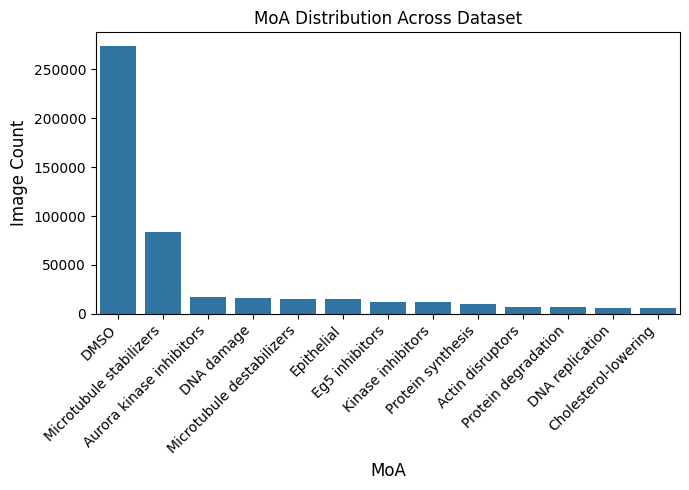

In [49]:
# count frequencies
moa_counts = pd.Series(meta_df["moa"]).value_counts().reset_index()
moa_counts.columns = ["MoA", "Image Count"]

# optional: plot
plt.figure(figsize=(7, 5))
sns.barplot(data=moa_counts, x="MoA", y="Image Count")
# show counts on bars
# for index, value in enumerate(moa_counts["Image Count"]):
#     plt.text(value + 2000, index, str(value), va='center', fontsize=9)
plt.title("MoA Distribution Across Dataset")
plt.xticks(rotation=45, ha='right', fontsize=10)
plt.xlabel("MoA", fontsize=12)
plt.ylabel("Image Count", fontsize=12)
plt.tight_layout()
plt.show()

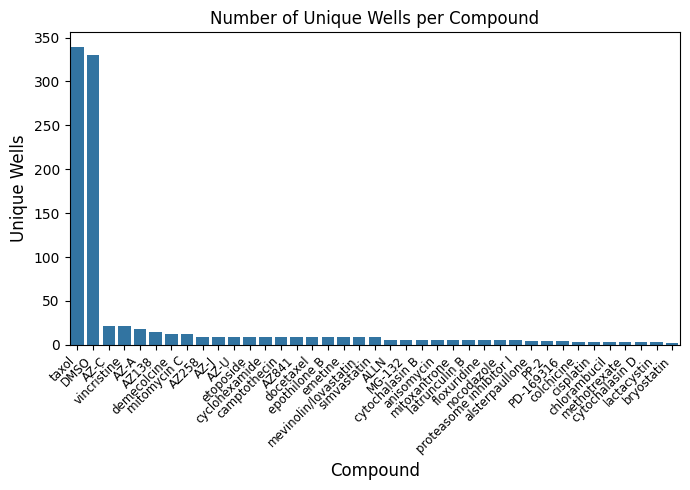

In [52]:
# Show well per compound
compound_well_counts = meta_df.groupby("compound")["well"].nunique().reset_index()
compound_well_counts.columns = ["Compound", "Unique Wells"]

plt.figure(figsize=(7, 5))
sorted_compounds = compound_well_counts.sort_values(by="Unique Wells", ascending=False)
sns.barplot(data=sorted_compounds, y="Unique Wells", x="Compound")
plt.xticks(rotation=45, ha='right', fontsize=8.5)
plt.title("Number of Unique Wells per Compound")
plt.xlabel("Compound", fontsize=12)
plt.ylabel("Unique Wells", fontsize=12)
plt.tight_layout()
plt.show()

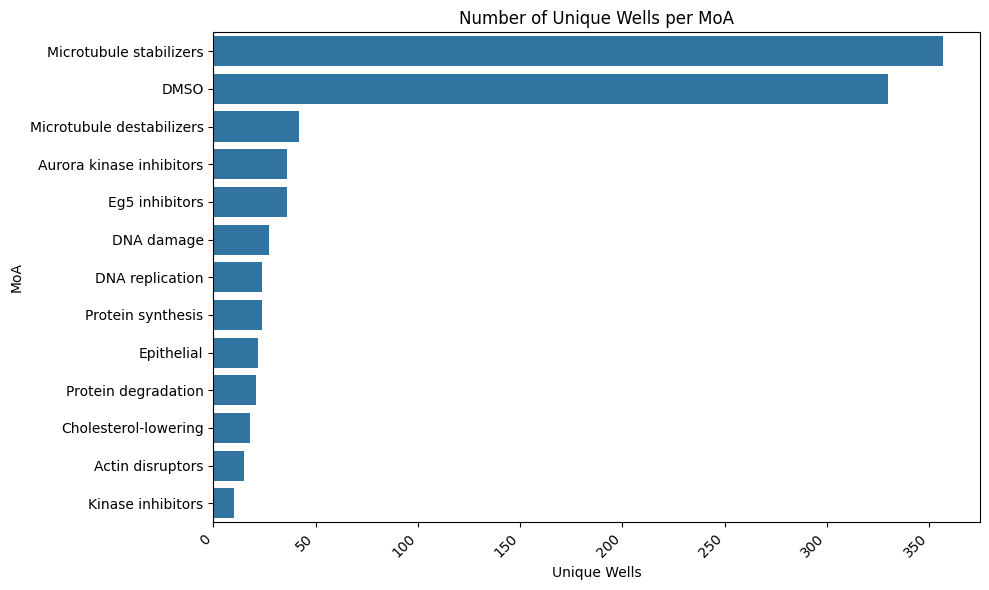

In [18]:
# Well per MoA
# number of unique wells per MoA
well_moa_counts = meta_df.groupby("moa")["well"].nunique().reset_index()
well_moa_counts.columns = ["MoA", "Unique Wells"]
plt.figure(figsize=(10, 6))
sorted_well_moa = well_moa_counts.sort_values(by="Unique Wells", ascending=False)
sns.barplot(data=sorted_well_moa, y="MoA", x="Unique Wells")
plt.xticks(rotation=45, ha='right')
plt.title("Number of Unique Wells per MoA")
plt.tight_layout()
plt.show()

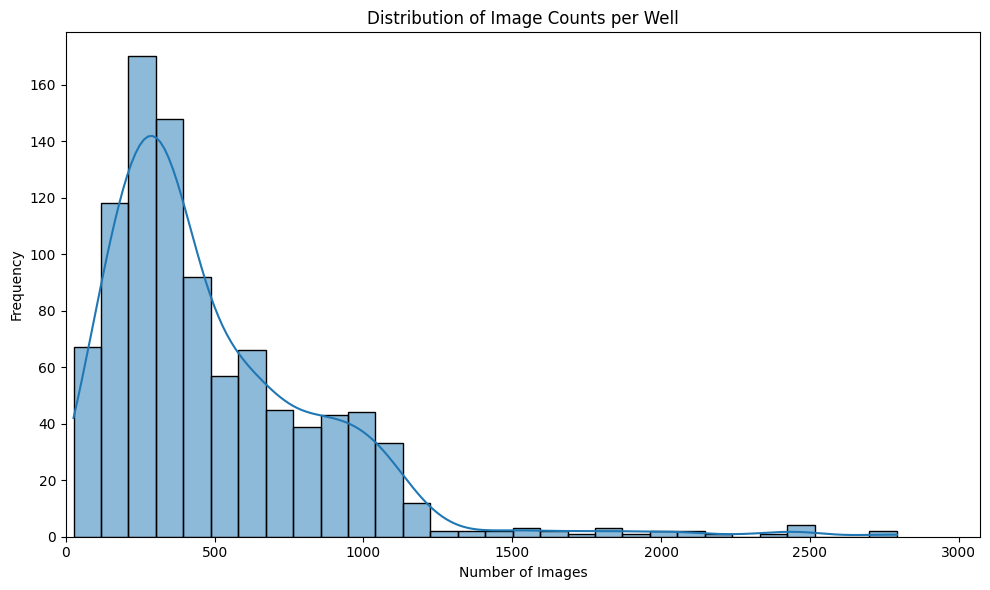

In [19]:
# Image count per well
well_image_counts = meta_df.groupby("well")["compound"].count().reset_index()
well_image_counts.columns = ["Well", "Image Count"]
plt.figure(figsize=(10, 6))
sns.histplot(well_image_counts["Image Count"], bins=30, kde=True)
plt.title("Distribution of Image Counts per Well")
plt.xlabel("Number of Images")
plt.ylabel("Frequency")
plt.xlim(0, well_image_counts["Image Count"].max() * 1.1)
plt.tight_layout()
plt.show()

In [20]:
# Give me a table with the number of images per compound
compound_image_counts = meta_df.groupby("compound")["well"].count().reset_index()
compound_image_counts.columns = ["Compound", "Image Count"]
compound_image_counts

,Compound,Image Count
0,ALLN,1708
1,AZ-A,7322
2,AZ-C,6440
3,AZ-J,6165
4,AZ-U,7239
5,AZ138,6085
6,AZ258,3995
7,AZ841,5493
8,DMSO,274152
9,MG-132,1042


In [21]:
# Table with the number of images per MoA
moa_image_counts = meta_df.groupby("moa")["well"].count().reset_index()
moa_image_counts.columns = ["MoA", "Image Count"]
moa_image_counts['Well Count'] = meta_df.groupby("moa")["well"].nunique().values
moa_image_counts["Compound Count"] = meta_df.groupby("moa")["compound"].nunique().values
# sort by image count
moa_image_counts = moa_image_counts.sort_values(by="Image Count", ascending=False)
moa_image_counts

,MoA,Image Count,Well Count,Compound Count
3,DMSO,274152,330,1
10,Microtubule stabilizers,83906,357,3
1,Aurora kinase inhibitors,16810,36,3
4,DNA damage,16582,27,4
9,Microtubule destabilizers,15096,42,4
7,Epithelial,14955,22,3
6,Eg5 inhibitors,12525,36,2
8,Kinase inhibitors,11622,10,3
12,Protein synthesis,9715,24,3
0,Actin disruptors,7405,15,3


In [22]:
pd.set_option('display.max_colwidth', None)
moa_image_counts = meta_df.groupby('moa')['well'].count().reset_index()
moa_image_counts.columns = ['MoA', 'Image Count']
moa_image_counts['Well Count'] = meta_df.groupby('moa')['well'].nunique().values
moa_image_counts['Compound Count'] = meta_df.groupby('moa')['compound'].nunique().values
moa_image_counts = moa_image_counts.sort_values(by='Well Count', ascending=False)
comp_counts = meta_df.groupby(['moa', 'compound'])['well'].nunique().reset_index(name='wells_per_compound')
comp_counts['entry'] = comp_counts['compound'] + ' (' + comp_counts['wells_per_compound'].astype(str) + ')'
comp_list = comp_counts.groupby('moa')['entry'].apply(lambda x: ', '.join(x)).reset_index(name='Compounds (wells)')
moa_image_counts = moa_image_counts.merge(comp_list, left_on='MoA', right_on='moa').drop(columns=['moa'])
moa_image_counts

,MoA,Image Count,Well Count,Compound Count,Compounds (wells)
0,Microtubule stabilizers,83906,357,3,"docetaxel (9), epothilone B (9), taxol (339)"
1,DMSO,274152,330,1,DMSO (330)
2,Microtubule destabilizers,15096,42,4,"colchicine (3), demecolcine (12), nocodazole (6), vincristine (21)"
3,Aurora kinase inhibitors,16810,36,3,"AZ-A (18), AZ258 (9), AZ841 (9)"
4,Eg5 inhibitors,12525,36,2,"AZ-C (21), AZ138 (15)"
5,DNA damage,16582,27,4,"chlorambucil (3), cisplatin (3), etoposide (9), mitomycin C (12)"
6,DNA replication,5970,24,4,"camptothecin (9), floxuridine (6), methotrexate (3), mitoxantrone (6)"
7,Protein synthesis,9715,24,3,"anisomycin (6), cyclohexamide (9), emetine (9)"
8,Epithelial,14955,22,3,"AZ-J (9), AZ-U (9), PP-2 (4)"
9,Protein degradation,6589,21,4,"ALLN (6), MG-132 (6), lactacystin (3), proteasome inhibitor I (6)"


In [23]:
import random
from collections import defaultdict
import h5py

# Load metadata
cfg.data.metadata_path = '../data/raw/metadata_dataset.h5'
with h5py.File(cfg.data.metadata_path, 'r') as f:
    wells_meta     = [w.decode('utf-8') for w in f['metadata_well'][:]]
    compounds_meta = [c.decode('utf-8') for c in f['metadata_compound'][:]]
    concentrations_meta = [c.decode('utf-8') for c in f['metadata_concentration'][:]]
    moas_meta      = [m.decode('utf-8') for m in f['metadata_moa'][:]]

# Build mapping: compound-concentration → unique set of wells
compound_to_wells = defaultdict(set)

for well, compound in zip(wells_meta, compounds_meta):
    compound_to_wells[compound].add(well)

# Convert sets to sorted lists (for deterministic order)
compound_to_wells = {k: list(v) for k, v in compound_to_wells.items()}

# Check total and targets
total_wells = sum(len(wells) for wells in compound_to_wells.values())
val_target  = int(round(cfg.data.val_ratio  * total_wells))
test_target = int(round(cfg.data.test_ratio * total_wells))

print(f"Total wells (unique per compound-conc): {total_wells}, Validation target: {val_target}, Test target: {test_target}")

Total wells (unique per compound-conc): 962, Validation target: 96, Test target: 96


In [24]:
len(compound_to_wells.items())

39

In [123]:
# make a mutable copy of each compound’s wells
comp_wells = {c: list(wells) for c, wells in compound_to_wells.items()}

# initialize split‐storage and counters
split_wells = {'train': [], 'val': [], 'test': []}
val_count = 0
test_count = 0
val_full = False
test_full = False

# sort compounds by ascending number of wells
random_comps = random.sample(list(comp_wells.keys()), len(comp_wells))

print(f"Total wells: {total_wells}, Val target: {val_target}, Test target: {test_target}")
# --------------------
# 2) Round‐robin assign
# --------------------
# keep cycling through compounds until val and test quotas are met
random.seed(13)  # for reproducibility

while not (val_full and test_full):
    for comp in random_comps:
        wells = comp_wells[comp]
        if not wells:
            continue

        random.shuffle(wells)

        # 2) Choose in which order to attempt splits
        if not val_full and not test_full:
            splits_order = random.sample(['val', 'test', 'train'], 3)
        elif val_full and not test_full:
            splits_order = random.sample(['test', 'train'], 2)
        elif test_full and not val_full:
            splits_order = random.sample(['val', 'train'], 2)
        else:
            splits_order = ['train']

        # 3) Assign one well to each split in the chosen order
        for split in splits_order:
            if not wells:
                break

            if split == 'val':
                if val_full:
                    continue
                val_count += 1
                if val_count >= val_target:
                    val_full = True

            elif split == 'test':
                if test_full:
                    continue
                test_count += 1
                if test_count >= test_target:
                    test_full = True

            split_wells[split].append(wells.pop(0))

    # 4) Stop early if both val and test are full
    if val_full and test_full:
        break

# 5) Any wells left go into the training split
for remaining in comp_wells.values():
    split_wells['train'].extend(remaining)

Total wells: 962, Val target: 96, Test target: 96


In [175]:
import random
from collections import defaultdict
import h5py

# Load metadata
cfg.data.metadata_path = '../data/raw/metadata_dataset.h5'
with h5py.File(cfg.data.metadata_path, 'r') as f:
    wells_meta     = [w.decode('utf-8') for w in f['metadata_well'][:]]
    compounds_meta = [c.decode('utf-8') for c in f['metadata_compound'][:]]

# Build mapping: compound-concentration → unique set of wells
compound_to_wells = defaultdict(list)
for well, comp in zip(wells_meta, compounds_meta):
    # only append if we haven’t seen this well for this compound yet
    if well not in compound_to_wells[comp]:
        compound_to_wells[comp].append(well)

# Convert sets to sorted lists (for deterministic order)
compound_to_wells = {k: list(v) for k, v in compound_to_wells.items()}

# Check total and targets
total_wells = sum(len(wells) for wells in compound_to_wells.values())
val_target  = int(round(cfg.data.val_ratio  * total_wells))
test_target = int(round(cfg.data.test_ratio * total_wells))

print(f"Total wells (unique per compound-conc): {total_wells}, Validation target: {val_target}, Test target: {test_target}")

# 1) Create a mutable copy of the well list per compound
comp_wells = {c: list(wells) for c, wells in compound_to_wells.items()}

# 2) Initialize split tracking
split_wells = {'train': [], 'val': [], 'test': []}
val_count, test_count = 0, 0
val_full, test_full = False, False

# Set targets (already defined earlier)
total_wells = sum(len(w) for w in compound_to_wells.values())
val_target  = int(round(cfg.data.val_ratio  * total_wells))
test_target = int(round(cfg.data.test_ratio * total_wells))

print(f"Total wells: {total_wells}, Val target: {val_target}, Test target: {test_target}")

# 3) Seeding step — ensure every compound is represented in val/test/train
random.seed(1)
for comp in random.sample(list(comp_wells.keys()), len(comp_wells)):
    wells = comp_wells[comp]
    random.shuffle(wells)

    if wells:
        split_wells['val'].append(wells.pop(0))
        val_count += 1
    if wells:
        split_wells['test'].append(wells.pop(0))
        test_count += 1
    if wells:
        split_wells['train'].append(wells.pop(0))

# 4) Collect remaining wells across all compounds
remaining_wells = [w for wl in comp_wells.values() for w in wl]
random.shuffle(remaining_wells)

# 5) Assign remaining wells based on fill status
for well in remaining_wells:
    if not val_full and val_count < val_target:
        split_wells['val'].append(well)
        val_count += 1
        if val_count >= val_target:
            val_full = True
    elif not test_full and test_count < test_target:
        split_wells['test'].append(well)
        test_count += 1
        if test_count >= test_target:
            test_full = True
    else:
        split_wells['train'].append(well)

# Done: split_wells['train'], ['val'], ['test'] are ready
print(f"Final counts — Train: {len(split_wells['train'])}, Val: {len(split_wells['val'])}, Test: {len(split_wells['test'])}")

Total wells (unique per compound-conc): 962, Validation target: 96, Test target: 96
Total wells: 962, Val target: 96, Test target: 96
Final counts — Train: 770, Val: 96, Test: 96


In [176]:
meta_df_train = meta_df[meta_df['well'].isin(split_wells['train'])]
meta_df_val = meta_df[meta_df['well'].isin(split_wells['val'])]
meta_df_test = meta_df[meta_df['well'].isin(split_wells['test'])]

In [177]:
# total number of images in each split
def count_images_per_split(meta_df):
    return meta_df.groupby('well').size().sum()
train_images = count_images_per_split(meta_df_train)
val_images = count_images_per_split(meta_df_val)
test_images = count_images_per_split(meta_df_test)
print(f"Train images: {train_images}")
print(f"Validation images: {val_images}")
print(f"Test images: {test_images}")

# procentage of images in each split
def percentage_split(meta_df, total_images):
    return (count_images_per_split(meta_df) / total_images) * 100
total_images = train_images + val_images + test_images
print(f"Train split percentage: {percentage_split(meta_df_train, total_images):.2f}%")
print(f"Validation split percentage: {percentage_split(meta_df_val, total_images):.2f}%")
print(f"Test split percentage: {percentage_split(meta_df_test, total_images):.2f}%")

Train images: 385414
Validation images: 48891
Test images: 46458
Train split percentage: 80.17%
Validation split percentage: 10.17%
Test split percentage: 9.66%


In [178]:
# Total number of images
total_images = count_images_per_split(meta_df)
print(f"Total images in dataset: {total_images}")

Total images in dataset: 480763


In [26]:
# how many compound and concentration combinations are in each split?
def count_compound_concentration_combinations(meta_df):
    return meta_df.groupby(['compound', 'concentration']).size().reset_index(name='count')
train_combinations = count_compound_concentration_combinations(meta_df_train)
val_combinations = count_compound_concentration_combinations(meta_df_val)
test_combinations = count_compound_concentration_combinations(meta_df_test)
total_combinations = count_compound_concentration_combinations(meta_df)
print(f"Train combinations: {len(train_combinations)}")
print(f"Validation combinations: {len(val_combinations)}")
print(f"Test combinations: {len(test_combinations)}")
print(f"Total combinations: {len(total_combinations)}")

Train combinations: 101
Validation combinations: 47
Test combinations: 47
Total combinations: 104


In [27]:
df = meta_df_train
pd.set_option('display.max_colwidth', None)
moa_image_counts = df.groupby('moa')['well'].count().reset_index()
moa_image_counts.columns = ['MoA', 'Image Count']
moa_image_counts['Well Count'] = df.groupby('moa')['well'].nunique().values
moa_image_counts['Compound Count'] = df.groupby('moa')['compound'].nunique().values
moa_image_counts = moa_image_counts.sort_values(by='Well Count', ascending=False)
comp_counts = df.groupby(['moa', 'compound'])['well'].nunique().reset_index(name='wells_per_compound')
comp_counts['entry'] = comp_counts['compound'] + ' (' + comp_counts['wells_per_compound'].astype(str) + ')'
comp_list = comp_counts.groupby('moa')['entry'].apply(lambda x: ', '.join(x)).reset_index(name='Compounds (wells)')
moa_image_counts = moa_image_counts.merge(comp_list, left_on='MoA', right_on='moa').drop(columns=['moa'])
moa_image_counts

,MoA,Image Count,Well Count,Compound Count,Compounds (wells)
0,Microtubule stabilizers,69706,301,3,"docetaxel (6), epothilone B (6), taxol (289)"
1,DMSO,235413,281,1,DMSO (281)
2,Microtubule destabilizers,10487,30,4,"colchicine (1), demecolcine (9), nocodazole (4), vincristine (16)"
3,Eg5 inhibitors,9795,29,2,"AZ-C (19), AZ138 (10)"
4,Aurora kinase inhibitors,12053,26,3,"AZ-A (13), AZ258 (6), AZ841 (7)"
5,DNA damage,10377,17,4,"chlorambucil (1), cisplatin (1), etoposide (6), mitomycin C (9)"
6,Protein synthesis,6735,17,3,"anisomycin (4), cyclohexamide (7), emetine (6)"
7,DNA replication,3647,16,4,"camptothecin (7), floxuridine (4), methotrexate (1), mitoxantrone (4)"
8,Epithelial,9964,15,3,"AZ-J (7), AZ-U (6), PP-2 (2)"
9,Cholesterol-lowering,4270,13,2,"mevinolin/lovastatin (6), simvastatin (7)"


In [28]:
df = meta_df_val
pd.set_option('display.max_colwidth', None)
moa_image_counts = df.groupby('moa')['well'].count().reset_index()
moa_image_counts.columns = ['MoA', 'Image Count']
moa_image_counts['Well Count'] = df.groupby('moa')['well'].nunique().values
moa_image_counts['Compound Count'] = df.groupby('moa')['compound'].nunique().values
moa_image_counts = moa_image_counts.sort_values(by='Well Count', ascending=False)
comp_counts = df.groupby(['moa', 'compound'])['well'].nunique().reset_index(name='wells_per_compound')
comp_counts['entry'] = comp_counts['compound'] + ' (' + comp_counts['wells_per_compound'].astype(str) + ')'
comp_list = comp_counts.groupby('moa')['entry'].apply(lambda x: ', '.join(x)).reset_index(name='Compounds (wells)')
moa_image_counts = moa_image_counts.merge(comp_list, left_on='MoA', right_on='moa').drop(columns=['moa'])
moa_image_counts

,MoA,Image Count,Well Count,Compound Count,Compounds (wells)
0,Microtubule stabilizers,7019,27,3,"docetaxel (2), epothilone B (1), taxol (24)"
1,DMSO,21005,26,1,DMSO (26)
2,Aurora kinase inhibitors,2796,6,3,"AZ-A (3), AZ258 (2), AZ841 (1)"
3,Microtubule destabilizers,2082,5,4,"colchicine (1), demecolcine (1), nocodazole (1), vincristine (2)"
4,DNA damage,3068,5,4,"chlorambucil (1), cisplatin (1), etoposide (2), mitomycin C (1)"
5,Protein synthesis,1861,4,3,"anisomycin (1), cyclohexamide (1), emetine (2)"
6,Protein degradation,1103,4,4,"ALLN (1), MG-132 (1), lactacystin (1), proteasome inhibitor I (1)"
7,DNA replication,1303,4,4,"camptothecin (1), floxuridine (1), methotrexate (1), mitoxantrone (1)"
8,Actin disruptors,1457,3,3,"cytochalasin B (1), cytochalasin D (1), latrunculin B (1)"
9,Cholesterol-lowering,598,3,2,"mevinolin/lovastatin (2), simvastatin (1)"


In [29]:
df = meta_df_test
pd.set_option('display.max_colwidth', None)
moa_image_counts = df.groupby('moa')['well'].count().reset_index()
moa_image_counts.columns = ['MoA', 'Image Count']
moa_image_counts['Well Count'] = df.groupby('moa')['well'].nunique().values
moa_image_counts['Compound Count'] = df.groupby('moa')['compound'].nunique().values
moa_image_counts = moa_image_counts.sort_values(by='Well Count', ascending=False)
comp_counts = df.groupby(['moa', 'compound'])['well'].nunique().reset_index(name='wells_per_compound')
comp_counts['entry'] = comp_counts['compound'] + ' (' + comp_counts['wells_per_compound'].astype(str) + ')'
comp_list = comp_counts.groupby('moa')['entry'].apply(lambda x: ', '.join(x)).reset_index(name='Compounds (wells)')
moa_image_counts = moa_image_counts.merge(comp_list, left_on='MoA', right_on='moa').drop(columns=['moa'])
moa_image_counts

,MoA,Image Count,Well Count,Compound Count,Compounds (wells)
0,Microtubule stabilizers,7181,29,3,"docetaxel (1), epothilone B (2), taxol (26)"
1,DMSO,17734,23,1,DMSO (23)
2,Microtubule destabilizers,2527,7,4,"colchicine (1), demecolcine (2), nocodazole (1), vincristine (3)"
3,DNA damage,3137,5,4,"chlorambucil (1), cisplatin (1), etoposide (1), mitomycin C (2)"
4,Protein degradation,1502,5,4,"ALLN (1), MG-132 (2), lactacystin (1), proteasome inhibitor I (1)"
5,Eg5 inhibitors,1535,4,2,"AZ-C (1), AZ138 (3)"
6,Epithelial,2949,4,3,"AZ-J (1), AZ-U (2), PP-2 (1)"
7,Aurora kinase inhibitors,1961,4,3,"AZ-A (2), AZ258 (1), AZ841 (1)"
8,DNA replication,1020,4,4,"camptothecin (1), floxuridine (1), methotrexate (1), mitoxantrone (1)"
9,Kinase inhibitors,3746,3,3,"PD-169316 (1), alsterpaullone (1), bryostatin (1)"


In [30]:
# how many componds in each split?
def count_compounds_per_split(meta_df):
    return meta_df['compound'].nunique()
train_compounds = count_compounds_per_split(meta_df_train)
val_compounds = count_compounds_per_split(meta_df_val)
test_compounds = count_compounds_per_split(meta_df_test)
print(f"Train compounds: {train_compounds}")
print(f"Validation compounds: {val_compounds}")
print(f"Test compounds: {test_compounds}")

Train compounds: 38
Validation compounds: 39
Test compounds: 39


In [31]:
moa_to_compounds = meta_df.groupby("moa")["compound"].unique()
moa_to_compounds = moa_to_compounds.apply(lambda x: ", ".join(sorted(set(x))))
moa_to_compounds = moa_to_compounds.reset_index()
moa_to_compounds.columns = ["MoA", "Compounds"]
moa_to_compounds = moa_to_compounds.sort_values(by="MoA")
# Set table width max to 1000 characters for pd
pd.set_option('display.max_colwidth', 1000)
moa_to_compounds

,MoA,Compounds
0,Actin disruptors,"cytochalasin B, cytochalasin D, latrunculin B"
1,Aurora kinase inhibitors,"AZ-A, AZ258, AZ841"
2,Cholesterol-lowering,"mevinolin/lovastatin, simvastatin"
3,DMSO,DMSO
4,DNA damage,"chlorambucil, cisplatin, etoposide, mitomycin C"
5,DNA replication,"camptothecin, floxuridine, methotrexate, mitoxantrone"
6,Eg5 inhibitors,"AZ-C, AZ138"
7,Epithelial,"AZ-J, AZ-U, PP-2"
8,Kinase inhibitors,"PD-169316, alsterpaullone, bryostatin"
9,Microtubule destabilizers,"colchicine, demecolcine, nocodazole, vincristine"


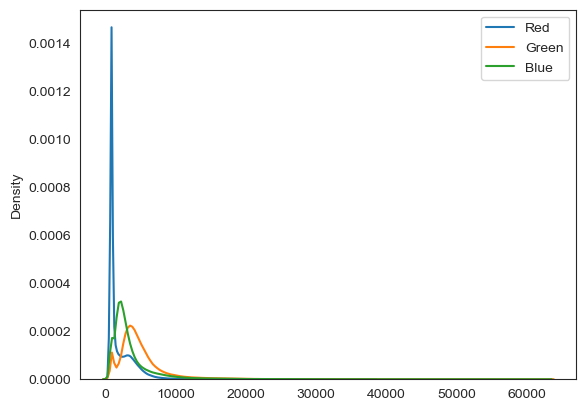

In [21]:
import seaborn as sns
get_random_images = get_random_image(1000)
sns.kdeplot(get_random_images[:, :, :, 0].ravel(), label='Red')
sns.kdeplot(get_random_images[:, :, :, 1].ravel(), label='Green')
sns.kdeplot(get_random_images[:, :, :, 2].ravel(), label='Blue')
plt.legend()
plt.show()

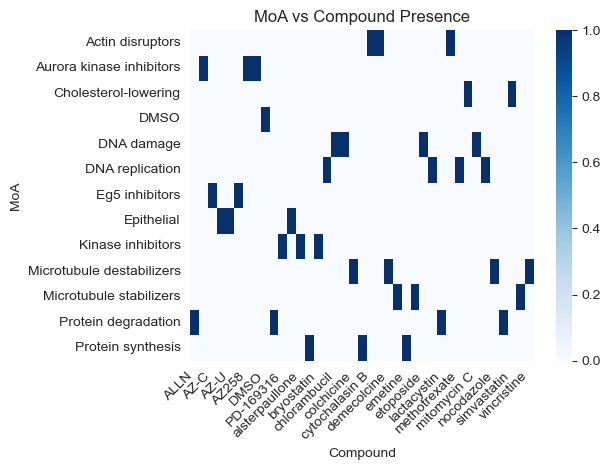

In [22]:
moa_compound_counts = meta_df.groupby(['moa', 'compound']).size().unstack(fill_value=0)
sns.heatmap(moa_compound_counts > 0, cmap='Blues')
plt.title("MoA vs Compound Presence")
plt.xlabel("Compound")
plt.ylabel("MoA")
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

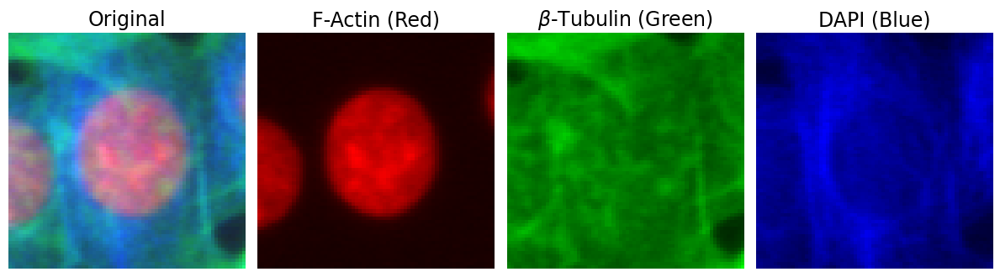

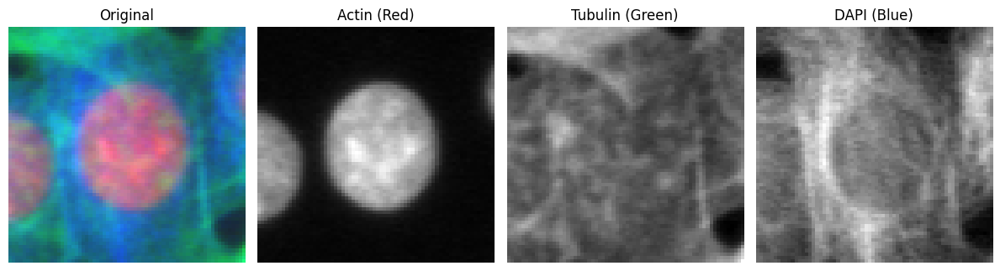

In [113]:
img = data_loader.dataset[0][0]
image = img.numpy().transpose(1, 2, 0)  # Convert to HWC format

red_channel   = np.zeros_like(image)
green_channel = np.zeros_like(image)
blue_channel  = np.zeros_like(image)

red_channel[:, :, 0] = image[:, :, 0]   # Actin (R)
green_channel[:, :, 1] = image[:, :, 1] # Tubulin (G)
blue_channel[:, :, 2] = image[:, :, 2]  # DAPI (B)

# Plot
fig, axs = plt.subplots(1, 4, figsize=(12, 4))
axs[0].imshow(image, vmin=0, vmax=255)
axs[0].set_title("Original", fontsize=17)
axs[1].imshow(red_channel, vmin=0, vmax=255)
axs[1].set_title("F-Actin (Red)", fontsize=17)
axs[2].imshow(green_channel, vmin=0, vmax=255)
axs[2].set_title(r"$\beta$-Tubulin (Green)", fontsize=17)
axs[3].imshow(blue_channel, vmin=0, vmax=255)
axs[3].set_title("DAPI (Blue)", fontsize=17)

for ax in axs:
    ax.axis("off")

plt.tight_layout()
plt.show()

# Show as grayscale
fig, axs = plt.subplots(1, 4, figsize=(12, 4))
axs[0].imshow(image[:, :, :], cmap='gray')
axs[0].set_title("Original")
axs[1].imshow(image[:, :, 0], cmap='gray')
axs[1].set_title("Actin (Red)")
axs[2].imshow(image[:, :, 1], cmap='gray')
axs[2].set_title("Tubulin (Green)")
axs[3].imshow(image[:, :, 2], cmap='gray')
axs[3].set_title("DAPI (Blue)")
for ax in axs:
    ax.axis("off")
plt.tight_layout()
plt.show()

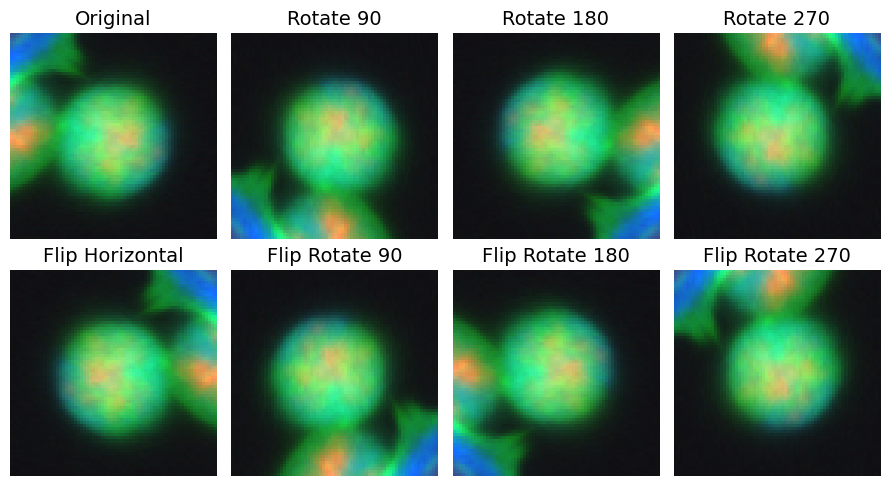

In [36]:
# Show an image and all the number of augmentations
def show_image_with_augmentations(image, augmentations):
    fig, axs = plt.subplots(2, (len(augmentations) + 1) // 2, figsize=(9, 5))
    axs = axs.flatten()

    for i, (name, aug_image) in enumerate(augmentations.items()):
        axs[i].imshow(aug_image)
        axs[i].set_title(name, fontsize=14)
        axs[i].axis('off')
    plt.tight_layout()
    plt.show()

# Example usage
img = get_random_image(1)[0]  # Get a random image
img_normalized = max_normalize_image(img)  # Normalize the image
# 8 different augmentations 0, 90, 180, 270 - no flip and 0, 90, 180, 270 - flip
augmentations = {
    "Original": img_normalized,
    "Rotate 90": np.rot90(img_normalized, k=1, axes=(0, 1)),
    "Rotate 180": np.rot90(img_normalized, k=2, axes=(0, 1)),
    "Rotate 270": np.rot90(img_normalized, k=3, axes=(0, 1)),
    "Flip Horizontal": np.fliplr(img_normalized),
    "Flip Rotate 90": np.fliplr(np.rot90(img_normalized, k=1, axes=(0, 1))),
    "Flip Rotate 180": np.fliplr(np.rot90(img_normalized, k=2, axes=(0, 1))),
    "Flip Rotate 270": np.fliplr(np.rot90(img_normalized, k=3, axes=(0, 1))),
}
show_image_with_augmentations(img_normalized, augmentations)

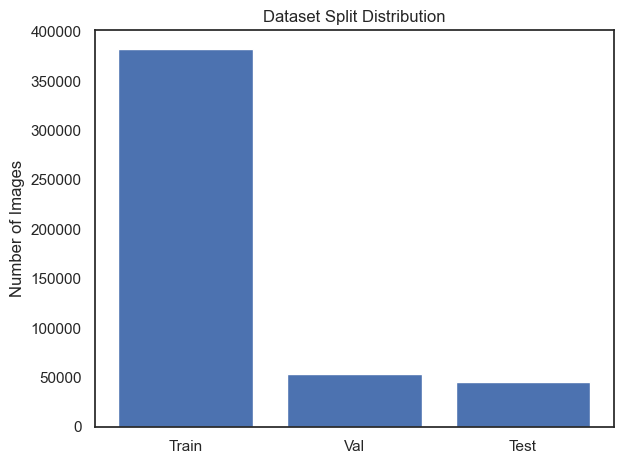

In [157]:
num_train = 382145 
num_val = 53263 
num_test = 45355 

plt.bar(["Train", "Val", "Test"], [num_train, num_val, num_test])
plt.ylabel("Number of Images")
plt.title("Dataset Split Distribution")
plt.tight_layout()
plt.show()

In [159]:
for moa in meta_df['moa'].unique():
    print(f"MoA: {moa}, Count: {len(meta_df[meta_df['moa'] == moa])}")

MoA: DMSO, Count: 274152
MoA: Protein synthesis, Count: 9715
MoA: Microtubule stabilizers, Count: 83906
MoA: Aurora kinase inhibitors, Count: 16810
MoA: DNA damage, Count: 16582
MoA: Eg5 inhibitors, Count: 12525
MoA: Epithelial, Count: 14955
MoA: Actin disruptors, Count: 7405
MoA: Microtubule destabilizers, Count: 15096
MoA: Protein degradation, Count: 6589
MoA: DNA replication, Count: 5970
MoA: Kinase inhibitors, Count: 11622
MoA: Cholesterol-lowering, Count: 5436


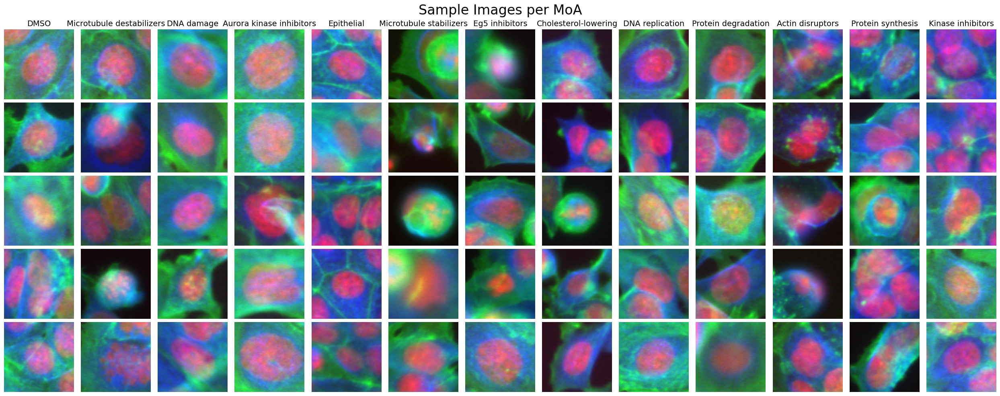

In [39]:
# plot one image per MoA
random.seed(42)  # For reproducibility
moas = meta_df['moa'].unique()
# sort moas by name length but interchange them, so long, short, long, short
moas = sorted(moas, key=lambda x: (len(x), x))
moas = [moas[i // 2] if i % 2 == 0 else moas[len(moas) - 1 - i // 2] for i in range(len(moas))]

nrows = 5
fig, axs = plt.subplots(nrows, len(moas), figsize=(25, nrows * 2))
for i, moa in enumerate(moas):
    for j in range(nrows):
        n = random.randint(0, len(meta_df[meta_df['moa'] == moa]) - 1)
        if j == 0:
            axs[j, i].set_title(moa, fontsize=14)
        sample_image = data_loader.dataset[meta_df[meta_df['moa'] == moa].index[n]][0]
        axs[j, i].imshow(sample_image.permute(1, 2, 0).numpy())
        axs[j, i].axis('off')
plt.suptitle("Sample Images per MoA", fontsize=24)
plt.tight_layout()
plt.show()

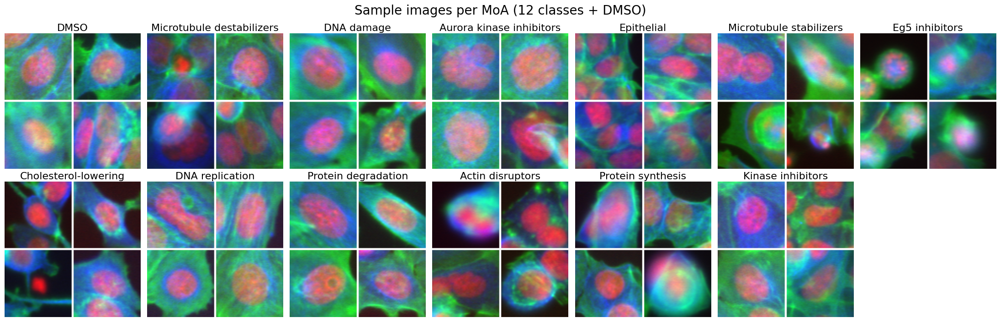

In [108]:
import matplotlib.pyplot as plt
import numpy as np
import random

random.seed(42)

# Prepare 13 MoAs
moas = meta_df['moa'].unique()
moas = sorted(moas, key=lambda x: (len(x), x))
moas = [moas[i // 2] if i % 2 == 0 else moas[len(moas) - 1 - i // 2] for i in range(len(moas))]
moas = moas[:13]

# Set up 2x7 grid of subplots
fig, axs = plt.subplots(2, 7, figsize=(22, 7))

for i in range(14):  # 2 rows × 7 columns = 14 slots
    row, col = divmod(i, 7)

    if i >= len(moas):
        axs[row, col].axis('off')  # Leave last subplot empty
        continue

    moa = moas[i]
    indices = meta_df[meta_df['moa'] == moa].index

    # Load 4 images (C, H, W)
    imgs = []
    for _ in range(4):
        idx = random.choice(indices)
        img = data_loader.dataset[idx][0].permute(1, 2, 0).numpy()  # (H, W, C)
        imgs.append(img)

    h, w, c = imgs[0].shape
    gap = 2  # 2-pixel black border

    # Create empty canvas with black center gap
    canvas = np.ones((2 * h + gap, 2 * w + gap, c), dtype=imgs[0].dtype)

    # Assign images into 2x2 positions with gap in between
    canvas[0:h, 0:w] = imgs[0]
    canvas[0:h, w + gap:] = imgs[1]
    canvas[h + gap:, 0:w] = imgs[2]
    canvas[h + gap:, w + gap:] = imgs[3]

    axs[row, col].imshow(canvas)
    axs[row, col].set_title(moa, fontsize=16, y=0.99)
    axs[row, col].axis('off')

plt.suptitle("Sample images per MoA (12 classes + DMSO)", fontsize=20, y=1.02)
plt.tight_layout()
plt.subplots_adjust(top=0.95)  # Adjust top to fit suptitle
plt.show()

In [29]:
test_loader.dataset.indices
# find moa for each image in the test set
test_moas = [meta_df.loc[idx, 'moa'] for idx in test_loader.dataset.indices]
# count unique MoAs in the test set
unique_test_moas = set(test_moas)
print(f"Unique MoAs in the test set: {len(unique_test_moas)}")

Unique MoAs in the test set: 13


In [30]:
# find number of componds in the test set
test_compounds = [meta_df.loc[idx, 'compound'] for idx in test_loader.dataset.indices]
unique_test_compounds = set(test_compounds)
print(f"Unique Compounds in the test set: {len(unique_test_compounds)}")

Unique Compounds in the test set: 39


DMSO Index: 363144, Cytochalasin D Index: 164239, Simvastatin Index: 461975, Nocodazole Index: 131978


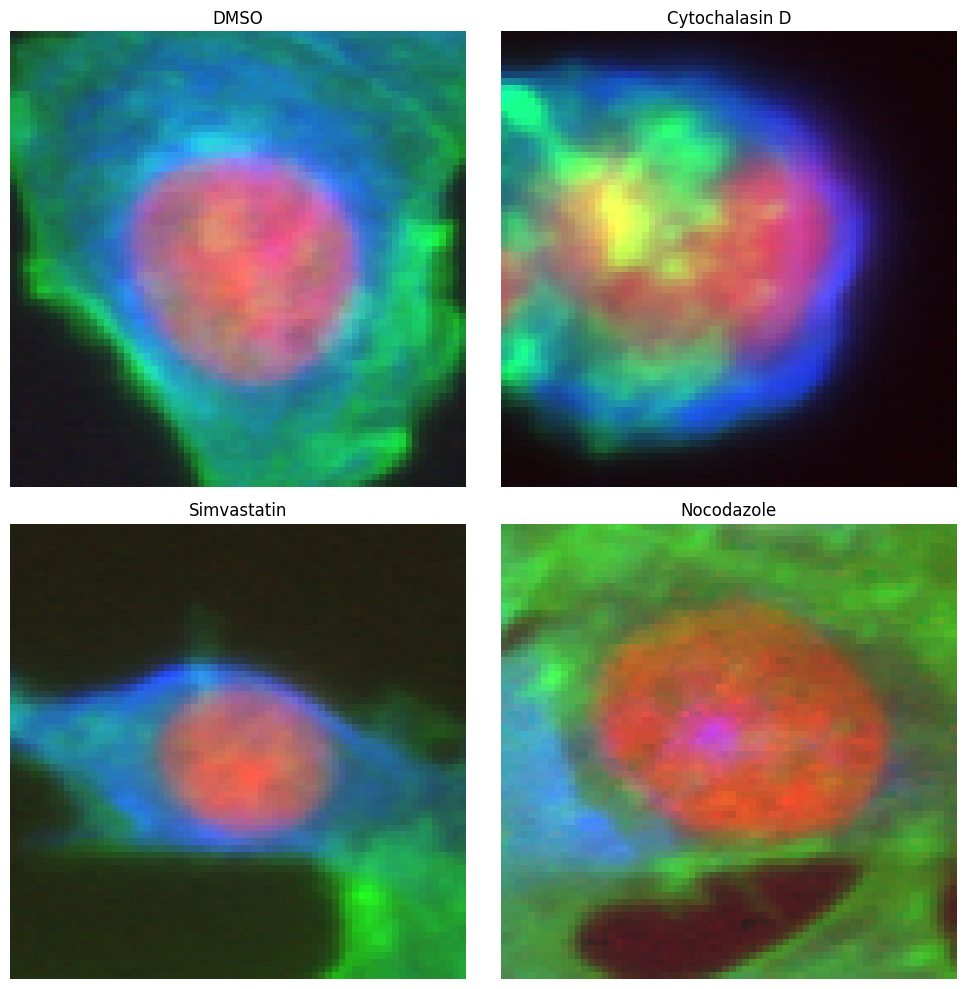

In [40]:
# Find idx of the first DMSO image, cytochalasin Image and simvastatin and Nocodazole
dmso_idx = next(idx for idx in test_loader.dataset.indices if meta_df.loc[idx, 'compound'] == 'DMSO')
cytochalasin_idx = next(idx for idx in test_loader.dataset.indices if meta_df.loc[idx, 'compound'] == 'cytochalasin D')
simvastatin_idx = next(idx for idx in test_loader.dataset.indices if meta_df.loc[idx, 'compound'] == 'simvastatin')
nocodazole_idx = next(idx for idx in test_loader.dataset.indices if meta_df.loc[idx, 'compound'] == 'nocodazole')

print(f"DMSO Index: {dmso_idx}, Cytochalasin D Index: {cytochalasin_idx}, Simvastatin Index: {simvastatin_idx}, Nocodazole Index: {nocodazole_idx}")
# Load the images
dmso_image = data_loader.dataset[dmso_idx][0].permute(1, 2, 0).numpy()
cytochalasin_image = data_loader.dataset[cytochalasin_idx][0].permute(1, 2, 0).numpy()
simvastatin_image = data_loader.dataset[simvastatin_idx][0].permute(1, 2, 0).numpy()
nocodazole_image = data_loader.dataset[nocodazole_idx][0].permute(1, 2, 0).numpy()
# Plot the images
fig, axs = plt.subplots(2, 2, figsize=(10, 10))
axs[0, 0].imshow(dmso_image)
axs[0, 0].set_title("DMSO")
axs[0, 1].imshow(cytochalasin_image)
axs[0, 1].set_title("Cytochalasin D")
axs[1, 0].imshow(simvastatin_image)
axs[1, 0].set_title("Simvastatin")
axs[1, 1].imshow(nocodazole_image)
axs[1, 1].set_title("Nocodazole")
for ax in axs.flat:
    ax.axis('off')
plt.tight_layout()
plt.show()

In [37]:
# find the concentrations in the test set
cyto_test_conc = meta_df_test.loc[meta_df_test['compound'] == 'cytochalasin D', 'concentration'].unique()
simva_test_conc = meta_df_test.loc[meta_df_test['compound'] == 'simvastatin', 'concentration'].unique()
noco_test_conc = meta_df_test.loc[meta_df_test['compound'] == 'nocodazole', 'concentration'].unique()
print(f"Cytochalasin D Concentrations in test Set: {cyto_test_conc}")
print(f"Simvastatin Concentrations in test Set: {simva_test_conc}")
print(f"Nocodazole Concentrations in test Set: {noco_test_conc}")

Cytochalasin D Concentrations in test Set: ['0.3']
Simvastatin Concentrations in test Set: ['6.0']
Nocodazole Concentrations in test Set: ['1.0']


In [38]:
# find the concentrations in the val set
cyto_val_conc = meta_df_val.loc[meta_df_val['compound'] == 'cytochalasin D', 'concentration'].unique()
simva_val_conc = meta_df_val.loc[meta_df_val['compound'] == 'simvastatin', 'concentration'].unique()
noco_val_conc = meta_df_val.loc[meta_df_val['compound'] == 'nocodazole', 'concentration'].unique()
print(f"Cytochalasin D Concentrations in val Set: {cyto_val_conc}")
print(f"Simvastatin Concentrations in val Set: {simva_val_conc}")
print(f"Nocodazole Concentrations in val Set: {noco_val_conc}")

Cytochalasin D Concentrations in val Set: ['0.3']
Simvastatin Concentrations in val Set: ['6.0']
Nocodazole Concentrations in val Set: ['3.0']


In [39]:
# find the concentrations in the train set
cyto_train_conc = meta_df_train.loc[meta_df_train['compound'] == 'cytochalasin D', 'concentration'].unique()
simva_train_conc = meta_df_train.loc[meta_df_train['compound'] == 'simvastatin', 'concentration'].unique()
noco_train_conc = meta_df_train.loc[meta_df_train['compound'] == 'nocodazole', 'concentration'].unique()
print(f"Cytochalasin D Concentrations in Train Set: {cyto_train_conc}")
print(f"Simvastatin Concentrations in Train Set: {simva_train_conc}")
print(f"Nocodazole Concentrations in Train Set: {noco_train_conc}")

Cytochalasin D Concentrations in Train Set: ['0.3']
Simvastatin Concentrations in Train Set: ['20.0' '2.0' '6.0']
Nocodazole Concentrations in Train Set: ['1.0' '3.0']


In [59]:
cytochalasin_test_indices = meta_df_test[meta_df_test['compound'] == 'simvastatin'].index.tolist()
cytochalasin_test_indices[:5]

[461975, 461976, 461977, 461978, 461979]

In [47]:
np.array(test_loader.dataset.indices)

array([104528, 104529, 104530, ...,  29690,  29691,  29692])

In [60]:
# find cytochalasin_test_indices in the test_loader.dataset.indices
cytochalasin_test_indices_in_loader = [i for i, idx in enumerate(test_loader.dataset.indices) if idx in cytochalasin_test_indices]
cytochalasin_test_indices_in_loader[:5]

[402, 403, 404, 405, 406]

In [67]:
compound = 'DMSO'
indices = meta_df_test[meta_df_test['compound'] == compound].index.tolist()
test_indices_in_loader = [i for i, idx in enumerate(test_loader.dataset.indices) if idx in indices]
test_indices_in_loader[:5]

[8428, 8429, 8430, 8431, 8432]

In [68]:
compound = 'cytochalasin D'
indices = meta_df_test[meta_df_test['compound'] == compound].index.tolist()
test_indices_in_loader = [i for i, idx in enumerate(test_loader.dataset.indices) if idx in indices]
test_indices_in_loader[:5]

[11146, 11147, 11148, 11149, 11150]

In [69]:
compound = 'simvastatin'
indices = meta_df_test[meta_df_test['compound'] == compound].index.tolist()
test_indices_in_loader = [i for i, idx in enumerate(test_loader.dataset.indices) if idx in indices]
test_indices_in_loader[:5]

[402, 403, 404, 405, 406]

In [79]:
compound = 'nocodazole'
indices = meta_df_test[meta_df_test['compound'] == compound].index.tolist()
test_indices_in_loader = [i for i, idx in enumerate(test_loader.dataset.indices) if idx in indices]
test_indices_in_loader[:5]

[18940, 18941, 18942, 18943, 18944]

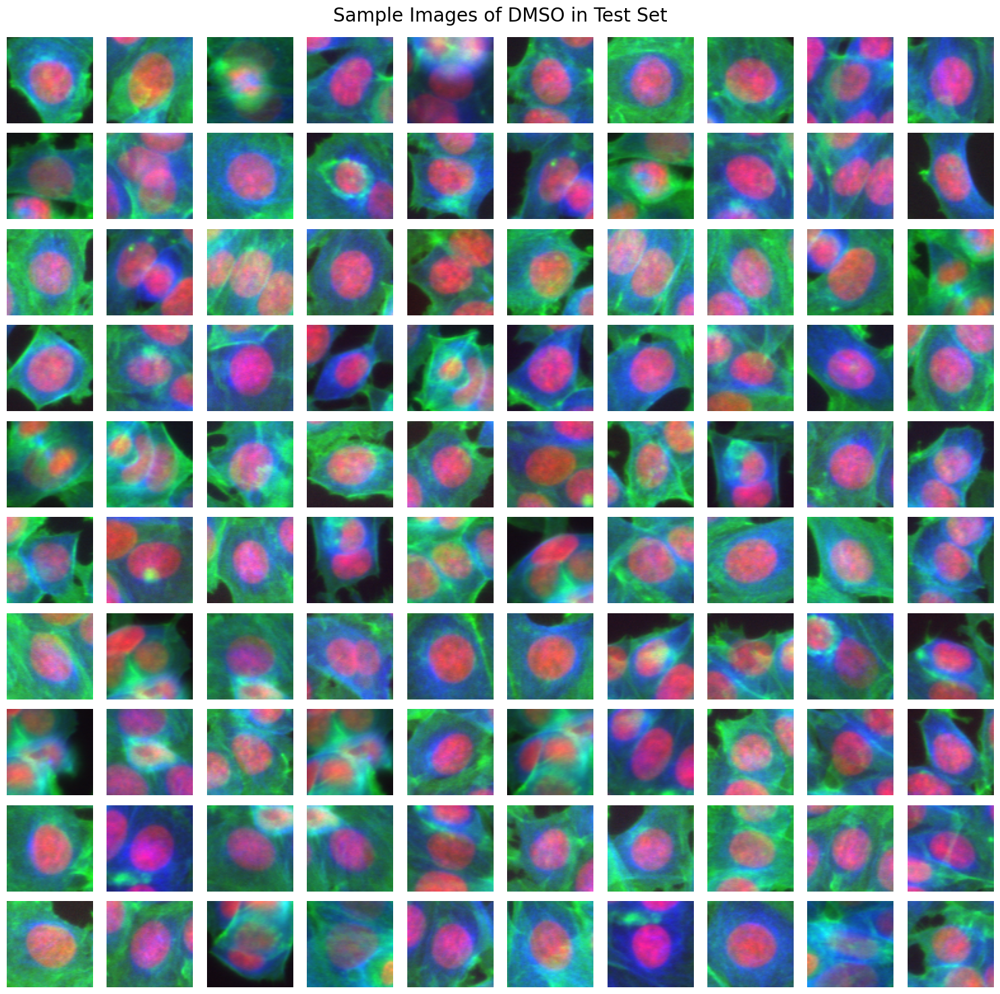

In [84]:
# Plot 10x10 of images of chosen compound
import matplotlib.pyplot as plt
import numpy as np

compound = 'DMSO'
num_images = 100
indices = meta_df_test[meta_df_test['compound'] == compound].index.tolist()
test_indices_in_loader = [i for i, idx in enumerate(test_loader.dataset.indices) if idx in indices]

images_DMSO = [test_loader.dataset[idx][0].permute(1, 2, 0).numpy() for idx in test_indices_in_loader]
fig, axs = plt.subplots(10, 10, figsize=(15, 15))
for i, ax in enumerate(axs.flat):
    if i < len(images_DMSO):
        ax.imshow(images_DMSO[i])
        ax.axis('off')
    else:
        ax.axis('off')  # Hide any unused subplots
plt.suptitle(f"Sample Images of {compound} in Test Set", fontsize=20)
plt.tight_layout()
plt.subplots_adjust(top=0.95)  # Adjust top to fit suptitle
plt.show()

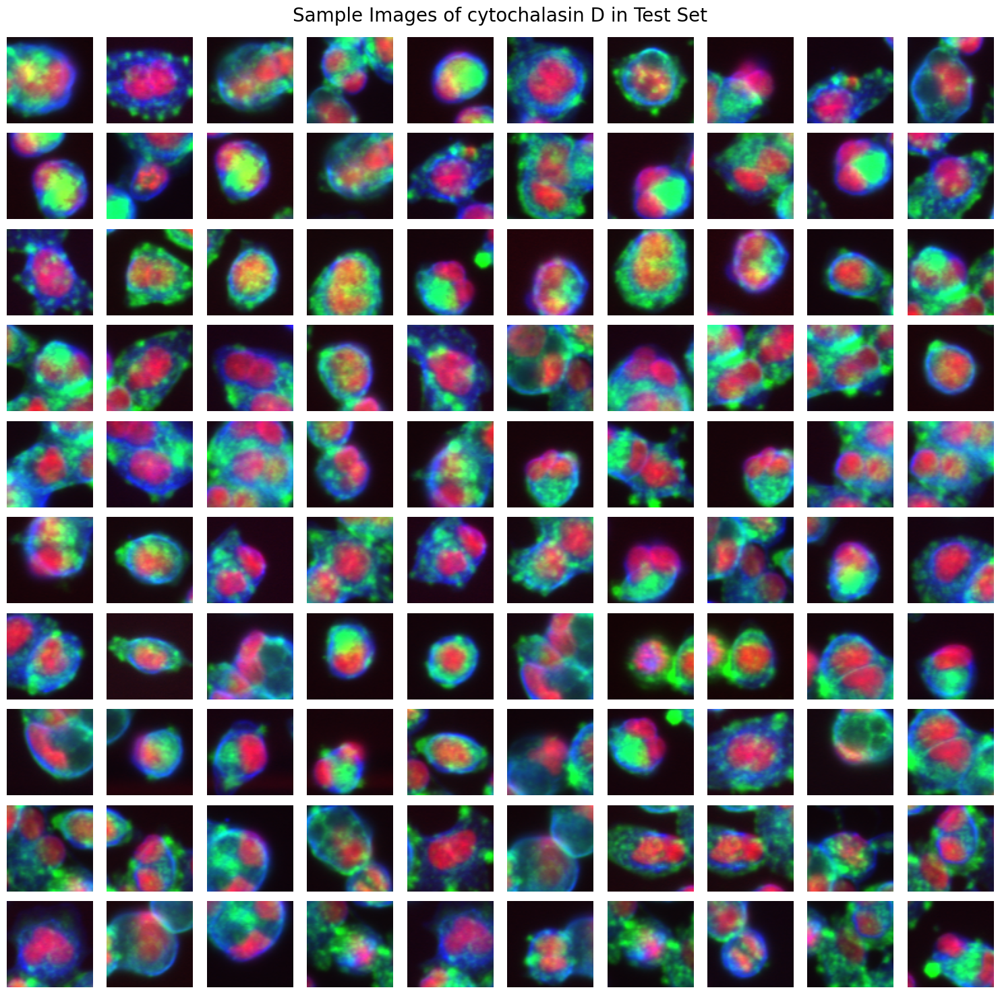

In [83]:
# Plot 10x10 of images of chosen compound
import matplotlib.pyplot as plt
import numpy as np

compound = 'cytochalasin D'
num_images = 100
indices = meta_df_test[meta_df_test['compound'] == compound].index.tolist()
test_indices_in_loader = [i for i, idx in enumerate(test_loader.dataset.indices) if idx in indices]

images_cyto = [test_loader.dataset[idx][0].permute(1, 2, 0).numpy() for idx in test_indices_in_loader]
fig, axs = plt.subplots(10, 10, figsize=(15, 15))
for i, ax in enumerate(axs.flat):
    if i < len(images_cyto):
        ax.imshow(images_cyto[i])
        ax.axis('off')
    else:
        ax.axis('off')  # Hide any unused subplots
plt.suptitle(f"Sample Images of {compound} in Test Set", fontsize=20)
plt.tight_layout()
plt.subplots_adjust(top=0.95)  # Adjust top to fit suptitle
plt.show()

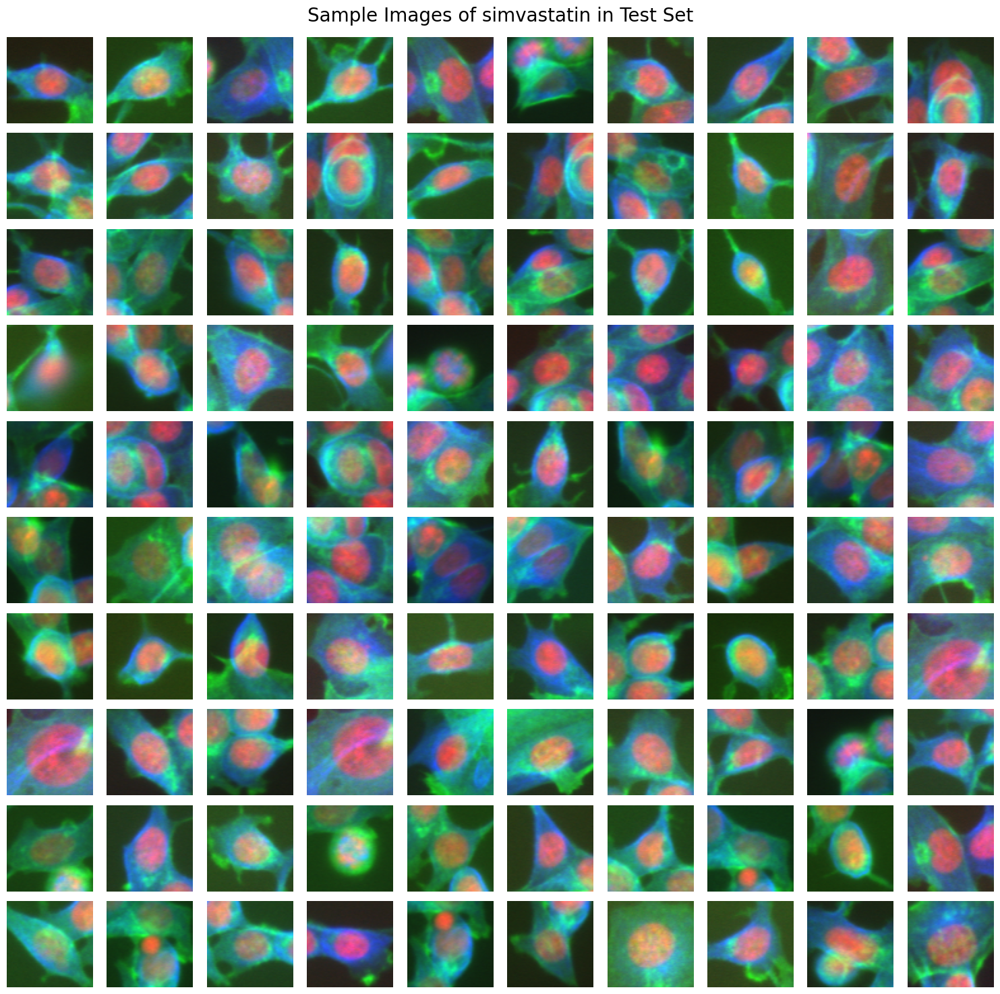

In [82]:
# Plot 10x10 of images of chosen compound
import matplotlib.pyplot as plt
import numpy as np

compound = 'simvastatin'
num_images = 100
indices = meta_df_test[meta_df_test['compound'] == compound].index.tolist()
test_indices_in_loader = [i for i, idx in enumerate(test_loader.dataset.indices) if idx in indices]

images_simva = [test_loader.dataset[idx][0].permute(1, 2, 0).numpy() for idx in test_indices_in_loader]
fig, axs = plt.subplots(10, 10, figsize=(15, 15))
for i, ax in enumerate(axs.flat):
    if i < len(images_simva):
        ax.imshow(images_simva[i])
        ax.axis('off')
    else:
        ax.axis('off')  # Hide any unused subplots
plt.suptitle(f"Sample Images of {compound} in Test Set", fontsize=20)
plt.tight_layout()
plt.subplots_adjust(top=0.95)  # Adjust top to fit suptitle
plt.show()

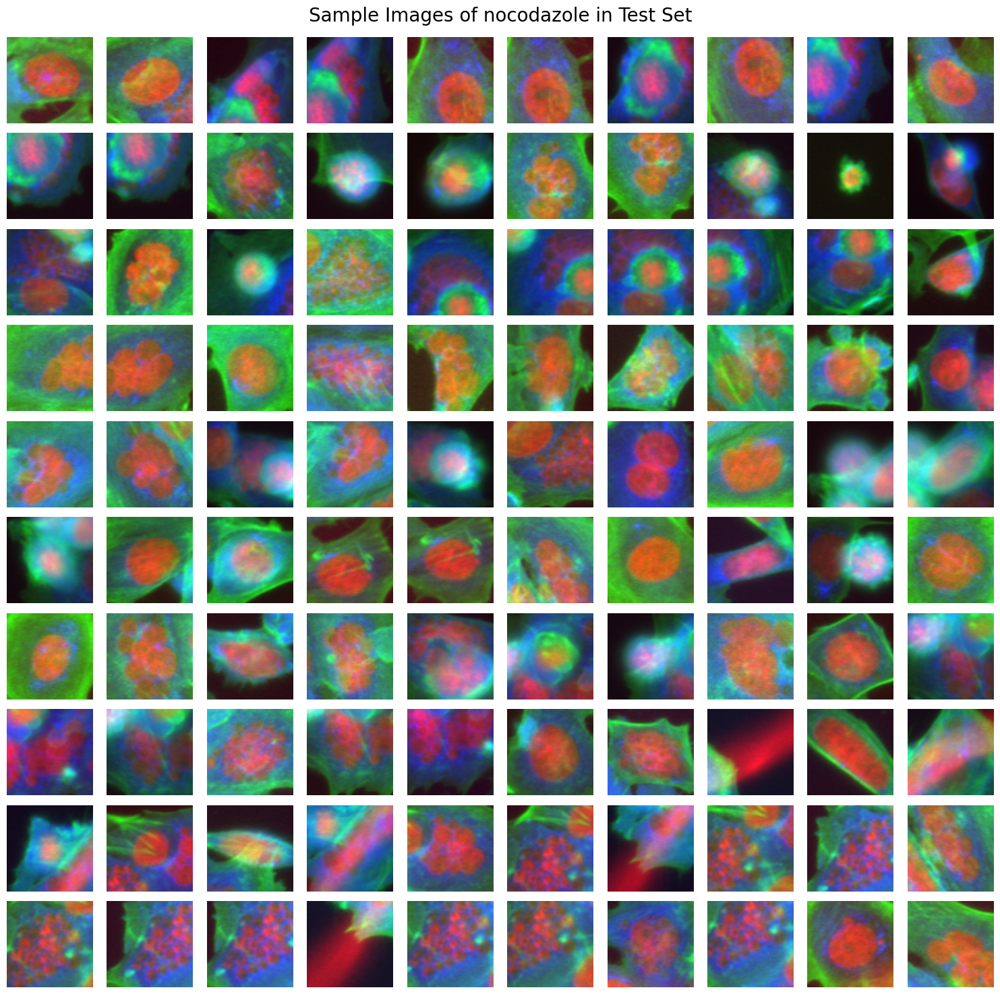

In [81]:
# Plot 10x10 of images of chosen compound
import matplotlib.pyplot as plt
import numpy as np

compound = 'nocodazole'
num_images = 100
indices = meta_df_test[meta_df_test['compound'] == compound].index.tolist()
test_indices_in_loader = [i for i, idx in enumerate(test_loader.dataset.indices) if idx in indices]

images_noco = [test_loader.dataset[idx][0].permute(1, 2, 0).numpy() for idx in test_indices_in_loader]
fig, axs = plt.subplots(10, 10, figsize=(15, 15))
for i, ax in enumerate(axs.flat):
    if i < len(images_noco):
        ax.imshow(images_noco[i])
        ax.axis('off')
    else:
        ax.axis('off')  # Hide any unused subplots
plt.suptitle(f"Sample Images of {compound} in Test Set", fontsize=20)
plt.tight_layout()
plt.subplots_adjust(top=0.95)  # Adjust top to fit suptitle
plt.show()

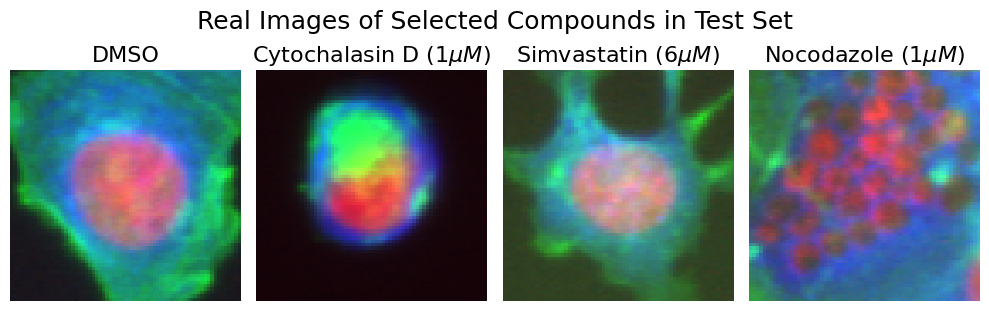

In [100]:
# Make a small figure with DMSO = 0, cytochalasin D = 63, simvastatin = 12, nocodazole = 94
import matplotlib.pyplot as plt

fig, axs = plt.subplots(1, 4, figsize=(10, 3))

# DMSO
axs[0].imshow(images_DMSO[0])
axs[0].set_title("DMSO", fontsize=16)
axs[0].axis('off')

# Cytochalasin D
axs[1].imshow(images_cyto[63])
axs[1].set_title(r"Cytochalasin D (1$\mu M$)", fontsize=16)
axs[1].axis('off')

# Simvastatin
axs[2].imshow(images_simva[12])
axs[2].set_title(r"Simvastatin (6$\mu M$)", fontsize=16)
axs[2].axis('off')

# Nocodazole
axs[3].imshow(images_noco[94])
axs[3].set_title(r"Nocodazole (1$\mu M$)", fontsize=16)
axs[3].axis('off')

plt.suptitle("Real Images of Selected Compounds in Test Set", fontsize=18, y=1.02)
plt.tight_layout()
plt.show()